# Training YOLO v8

This notebook trains a YOLOv8 object detector on the TACO dataset using the reduced 17-class taxonomy developed in the earlier experiments. It covers dataset conversion, progressively longer training runs, checkpoint comparison, reproducible validation, and visual analysis of the learning curves and predictions.

Training is deliberately staged. A smoke test verifies the complete pipeline, a pilot run tests whether additional optimization improves the detector, and a longer continuation run searches for the best checkpoint with early stopping.

## Install Packages

Install the data-processing, visualization, evaluation, and Ultralytics dependencies required by the notebook. In a fresh Colab runtime, run this cell before importing the packages. A runtime restart may be required if Colab replaces already imported binary dependencies.

In [ ]:
!pip install torchmetrics pycocotools gdown tqdm tensorboard albumentations ultralytics

## Import Packages

Import the standard data, numerical, PyTorch, and visualization libraries used throughout the workflow. The random-number generators are seeded immediately afterwards so that the image split and other stochastic operations are reproducible where the underlying CUDA operations permit it.

In [ ]:
import os
import pandas as pd
import json

import ast
import os
import torch

import numpy as np
import random

%matplotlib inline

In [3]:
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

In [4]:
torch.cuda.current_device()
torch.cuda.get_device_name(0)
device = torch.device("cuda")
device

device(type='cuda')

## Setup Environment

Detect whether the notebook is running in Google Colab and configure paths accordingly. Colab stores persistent outputs in Google Drive, while the non-Colab branch expects the project data under the remote machine's home directory. The following cells also mount Drive and load the processed annotation table or reconstruct it from the source COCO JSON.

In [5]:
def is_google_colab() -> bool:
    """Check whether the notebook is running in Google Colab.
    
    Returns:
        bool: ``True`` in a Colab runtime; otherwise ``False``.
    """
    try:
        import google.colab
        return True
    except ImportError:
        return False


IN_COLAB = is_google_colab()

if IN_COLAB:
    ROOT_PATH = "/content"
    DATAFRAME_PATH = "/content/drive/MyDrive/taco_trash"
    DEFAULT_RUNS_PATH = "/content/drive/MyDrive/taco_trash"
else:
    ROOT_PATH = "/home/ubuntu"
    DATAFRAME_PATH = os.path.join(ROOT_PATH, "taco_trash")
    DEFAULT_RUNS_PATH = os.path.join(ROOT_PATH, "taco_trash")

TACO_CLASSIFICATION_PATH = os.path.join(ROOT_PATH, "taco")

In [ ]:
if is_google_colab():
    from google.colab import drive
    drive.mount("/content/drive")
else:
    !curl https://rclone.org/install.sh | sudo bash

In [ ]:
def parse_bbox(v):
    if isinstance(v, str):
        return ast.literal_eval(v)
    return v
    
if is_google_colab():
    df = pd.read_csv(os.path.join(ROOT_PATH, "annotations_processed.csv"))
else:
    ann_path = os.path.join(TACO_CLASSIFICATION_PATH, "annotations.json")
    with open(ann_path, "r") as f:
        data = json.load(f)

    print(data.keys())

    for key in data.keys():
        if isinstance(data[key], list):
            print(key, len(data[key]))

    df_images = pd.DataFrame(data["images"])
    df_annotations = pd.DataFrame(data["annotations"])
    df_categories = pd.DataFrame(data["categories"])
    df_scene_annotations = pd.DataFrame(data["scene_annotations"])
    df_scene_categories = pd.DataFrame(data["scene_categories"])

    df = df_annotations.merge(
        df_images,
        left_on="image_id",
        right_on="id",
        how="left",
        suffixes=("", "_img"),
    ).merge(
        df_categories,
        left_on="category_id",
        right_on="id",
        how="left",
        suffixes=("", "_cat"),
    ).rename(
        columns={
            "id_x": "annotation_id",
            "id_y": "category_id_full",
            "name": "category_name",
        }
    )
    df['file_path'] = df['file_name'].map(lambda x: os.path.join(TACO_CLASSIFICATION_PATH, x) )

## Download Data

Download the TACO image archive and the processed annotation table used by the Colab workflow. The archive is extracted into the runtime's temporary storage for faster training, while model artifacts are written to persistent storage later in the notebook.

In [7]:
!gdown 1CUxA2TcZFhVJWvNH4qwlOSGDPlxodRPF
!unzip taco.zip -d $ROOT_PATH

Downloading...
From (original): https://drive.google.com/uc?id=1CUxA2TcZFhVJWvNH4qwlOSGDPlxodRPF
From (redirected): https://drive.google.com/uc?id=1CUxA2TcZFhVJWvNH4qwlOSGDPlxodRPF&confirm=t&uuid=856c045d-4de9-4850-b866-84a22982aa64
To: /content/taco.zip
100% 5.23G/5.23G [01:11<00:00, 73.5MB/s]
Archive:  taco.zip
   creating: /content/content/drive/MyDrive/taco_dataset/taco/
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/annotations.json  
   creating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000011.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000007.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000004.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000000.jpg  
  inflating: /content/content/drive/MyDrive/taco_dataset/taco/batch_14/000014.jpg  
  inflating: /content/content/drive/MyDrive/taco_

In [9]:
!gdown 1lj6H8pIbHjgrgNRWHoc41Nr8bi0FZ7mt # annotations_processed.csv

Downloading...
From: https://drive.google.com/uc?id=1lj6H8pIbHjgrgNRWHoc41Nr8bi0FZ7mt
To: /content/annotations_processed.csv
100% 3.10M/3.10M [00:00<00:00, 217MB/s]


## Convert Dataset to YOLO Format

YOLO expects one normalized text annotation file per image and a dataset YAML file describing the train/validation locations and class names. The conversion below maps the original fine-grained TACO labels to 17 broader classes, performs a deterministic image-level 80/20 split, clamps invalid box coordinates, and materializes the corresponding image and label directories.

The split is performed by image rather than annotation. This prevents objects from the same scene appearing in both training and validation data.

In [6]:
MAP_17 = {
    "Aerosol": "Can",
    "Aluminium foil": "Aluminium foil",
    "Battery": "Other",
    "Aluminium blister pack": "Other",
    "Carded blister pack": "Other",
    "Clear plastic bottle": "Plastic bottle",
    "Glass bottle": "Glass bottle",
    "Other plastic bottle": "Plastic bottle",
    "Plastic bottle cap": "Plastic bottle cap",
    "Metal bottle cap": "Metal bottle cap",
    "Broken glass": "Other",
    "Drink can": "Can",
    "Food Can": "Can",
    "Corrugated carton": "Carton",
    "Drink carton": "Carton",
    "Egg carton": "Carton",
    "Meal carton": "Carton",
    "Other carton": "Carton",
    "Paper cup": "Cup",
    "Disposable plastic cup": "Cup",
    "Foam cup": "Cup",
    "Glass cup": "Cup",
    "Other plastic cup": "Cup",
    "Food waste": "Other",
    "Plastic lid": "Plastic lid",
    "Metal lid": "Other",
    "Magazine paper": "Paper",
    "Tissues": "Paper",
    "Wrapping paper": "Paper",
    "Normal paper": "Paper",
    "Paper bag": "Paper",
    "Plastified paper bag": "Paper",
    "Pizza box": "Carton",
    "Garbage bag": "Plastic film",
    "Single-use carrier bag": "Plastic film",
    "Polypropylene bag": "Plastic film",
    "Produce bag": "Plastic film",
    "Cereal bag": "Plastic film",
    "Bread bag": "Plastic film",
    "Plastic film": "Plastic film",
    "Crisp packet": "Wrapper",
    "Other plastic wrapper": "Wrapper",
    "Retort pouch": "Wrapper",
    "Spread tub": "Plastic container",
    "Tupperware": "Plastic container",
    "Disposable food container": "Plastic container",
    "Foam food container": "Plastic container",
    "Other plastic container": "Plastic container",
    "Plastic glooves": "Other",
    "Plastic utensils": "Other",
    "Pop tab": "Pop tab",
    "Rope & strings": "Other",
    "Scrap metal": "Other",
    "Shoe": "Other",
    "Six pack rings": "Plastic film",
    "Squeezable tube": "Other",
    "Plastic straw": "Straw",
    "Paper straw": "Straw",
    "Styrofoam piece": "Styrofoam piece",
    "Toilet tube": "Carton",
    "Unlabeled litter": "Other",
    "Glass jar": "Other",
    "Other plastic": "Other",
    "Cigarette": "Other",
}

In [12]:
import json
import os
from pathlib import Path
import shutil

import torch


def convert_taco_to_yolo(
    taco_dir,
    output_dir,
    category_mapping,
    train_fraction=0.8,
    seed=42,
    image_mode="copy",
    drop_other=False,
):
    """Convert COCO-style TACO annotations to YOLO detection format.

    Args:
        taco_dir (str | Path): Directory containing `annotations.json`
            and the `batch_*` image directories.
        output_dir (str | Path): Destination directory for the YOLO dataset.
        category_mapping (dict[str, str]): Mapping from original TACO
            category names to the reduced taxonomy.
        train_fraction (float): Fraction of images used for training.
        seed (int): Seed for the deterministic image-level split.
        image_mode (str): One of `copy`, `symlink`, or `hardlink`.
        drop_other (bool): Whether to exclude annotations mapped to `Other`.

    Returns:
        Path: Path to the generated `taco.yaml`.
    """
    taco_dir = Path(taco_dir)
    output_dir = Path(output_dir)

    with (taco_dir / "annotations.json").open() as file:
        coco = json.load(file)

    images = {
        int(image["id"]): image
        for image in coco["images"]
    }

    categories = {
        int(category["id"]): category["name"]
        for category in coco["categories"]
    }

    annotations_by_image = {}
    for annotation in coco["annotations"]:
        image_id = int(annotation["image_id"])
        annotations_by_image.setdefault(image_id, []).append(annotation)

    mapped_names = {
        category_mapping.get(name, "Other")
        for name in categories.values()
    }

    if drop_other:
        mapped_names.discard("Other")

    class_names = sorted(mapped_names)
    name_to_id = {
        name: class_id
        for class_id, name in enumerate(class_names)
    }

    category_id_to_yolo_id = {}

    for category_id, category_name in categories.items():
        mapped_name = category_mapping.get(category_name, "Other")

        category_id_to_yolo_id[category_id] = (
            name_to_id.get(mapped_name)
        )

    # This reproduces torch.utils.data.random_split with the same seed.
    image_ids = sorted(images)
    generator = torch.Generator().manual_seed(seed)
    permutation = torch.randperm(
        len(image_ids),
        generator=generator,
    ).tolist()

    train_size = int(train_fraction * len(image_ids))

    train_ids = {
        image_ids[index]
        for index in permutation[:train_size]
    }

    val_ids = {
        image_ids[index]
        for index in permutation[train_size:]
    }

    def materialize_image(source, destination):
        destination.parent.mkdir(parents=True, exist_ok=True)

        if destination.exists() or destination.is_symlink():
            destination.unlink()

        if image_mode == "copy":
            shutil.copy2(source, destination)
        elif image_mode == "hardlink":
            os.link(source, destination)
        elif image_mode == "symlink":
            destination.symlink_to(source.resolve())
        else:
            raise ValueError(f"Unknown image_mode: {image_mode}")

    written_annotations = 0
    skipped_boxes = 0

    for image_id, image in images.items():
        split = "train" if image_id in train_ids else "val"

        relative_path = Path(image["file_name"])
        source_path = taco_dir / relative_path

        image_path = output_dir / "images" / split / relative_path
        label_path = (
            output_dir
            / "labels"
            / split
            / relative_path.with_suffix(".txt")
        )

        materialize_image(source_path, image_path)
        label_path.parent.mkdir(parents=True, exist_ok=True)

        image_width = int(image["width"])
        image_height = int(image["height"])

        label_lines = []

        for annotation in annotations_by_image.get(image_id, []):
            class_id = category_id_to_yolo_id[
                int(annotation["category_id"])
            ]

            if class_id is None:
                continue

            x, y, width, height = map(float, annotation["bbox"])

            # Clamp the box to valid image coordinates.
            x1 = min(max(x, 0.0), image_width)
            y1 = min(max(y, 0.0), image_height)
            x2 = min(max(x + width, 0.0), image_width)
            y2 = min(max(y + height, 0.0), image_height)

            width = x2 - x1
            height = y2 - y1

            if width <= 0 or height <= 0:
                skipped_boxes += 1
                continue

            x_center = ((x1 + x2) / 2) / image_width
            y_center = ((y1 + y2) / 2) / image_height
            width_normalized = width / image_width
            height_normalized = height / image_height

            label_lines.append(
                f"{class_id} "
                f"{x_center:.8f} "
                f"{y_center:.8f} "
                f"{width_normalized:.8f} "
                f"{height_normalized:.8f}"
            )

            written_annotations += 1

        label_path.write_text(
            "\n".join(label_lines) + ("\n" if label_lines else "")
        )

    output_dir.mkdir(parents=True, exist_ok=True)

    yaml_lines = [
        f'path: "{output_dir.resolve()}"',
        "train: images/train",
        "val: images/val",
        "names:",
    ]

    for class_id, class_name in enumerate(class_names):
        yaml_lines.append(
            f"  {class_id}: {json.dumps(class_name)}"
        )

    yaml_path = output_dir / "taco.yaml"
    yaml_path.write_text("\n".join(yaml_lines) + "\n")

    manifest = {
        "seed": seed,
        "train_image_ids": sorted(train_ids),
        "val_image_ids": sorted(val_ids),
        "classes": class_names,
        "written_annotations": written_annotations,
        "skipped_boxes": skipped_boxes,
    }

    (output_dir / "split.json").write_text(
        json.dumps(manifest, indent=2)
    )

    print(f"Train images: {len(train_ids)}")
    print(f"Validation images: {len(val_ids)}")
    print(f"Annotations: {written_annotations}")
    print(f"Classes: {len(class_names)}")
    print(f"Skipped boxes: {skipped_boxes}")
    print(f"YAML: {yaml_path}")

    return yaml_path

In [15]:
TACO_DIR = Path(
    "/content/taco"
)

YOLO_DIR = Path("/content/taco_yolo")

In [16]:
yaml_path = convert_taco_to_yolo(
      taco_dir=TACO_DIR,
      output_dir=YOLO_DIR,
      category_mapping=MAP_17,
      train_fraction=0.8,
      seed=42,
      image_mode="copy",
      drop_other=False,
  )

Train images: 1200
Validation images: 300
Annotations: 4784
Classes: 17
Skipped boxes: 0
YAML: /content/taco_yolo/taco.yaml


In [17]:
!ls -la /content/taco_yolo

total 36
drwxr-xr-x 4 root root  4096 Jul  5 16:20 .
drwxr-xr-x 1 root root  4096 Jul  5 16:20 ..
drwxr-xr-x 4 root root  4096 Jul  5 16:20 images
drwxr-xr-x 4 root root  4096 Jul  5 16:20 labels
-rw-r--r-- 1 root root 14336 Jul  5 16:20 split.json
-rw-r--r-- 1 root root   383 Jul  5 16:20 taco.yaml


## Train Model

Training is divided into three stages to control compute usage and expose failures early. Every Ultralytics run writes `results.csv`, checkpoints, curves, confusion matrices, and prediction previews into its run directory. The helper below reads these artifacts and produces the same compact diagnostics after each stage.

In [36]:
from pathlib import Path

import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import display
from PIL import Image


def plot_yolo_training_history(run_dir, title):
    """Plot losses and validation metrics recorded by an Ultralytics run.

    Args:
        run_dir (str | Path): Directory containing `results.csv`.
        title (str): Human-readable run name used in the figure title.

    Returns:
        pandas.DataFrame: Normalized epoch-level training history.
    """
    run_dir = Path(run_dir)
    history = pd.read_csv(run_dir / "results.csv")
    history.columns = history.columns.str.strip()

    figure, axes = plt.subplots(1, 3, figsize=(18, 5))

    loss_columns = [
        "train/box_loss",
        "train/cls_loss",
        "train/dfl_loss",
        "val/box_loss",
        "val/cls_loss",
        "val/dfl_loss",
    ]
    metric_columns = ["metrics/mAP50(B)", "metrics/mAP50-95(B)"]
    quality_columns = ["metrics/precision(B)", "metrics/recall(B)"]

    for column in loss_columns:
        if column in history:
            axes[0].plot(history["epoch"], history[column], label=column)

    for column in metric_columns:
        if column in history:
            axes[1].plot(history["epoch"], history[column], label=column)

    for column in quality_columns:
        if column in history:
            axes[2].plot(history["epoch"], history[column], label=column)

    if "metrics/mAP50-95(B)" in history:
        best_index = history["metrics/mAP50-95(B)"].idxmax()
        best_epoch = history.loc[best_index, "epoch"]
        for axis in axes[1:]:
            axis.axvline(
                best_epoch,
                color="black",
                linestyle="--",
                alpha=0.5,
                label=f"best epoch: {int(best_epoch)}",
            )

    for axis, subtitle in zip(
        axes,
        ["Training and validation losses", "Bounding-box mAP", "Precision and recall"],
    ):
        axis.set_title(subtitle)
        axis.set_xlabel("Epoch")
        axis.grid(alpha=0.25)
        axis.legend(fontsize=8)

    figure.suptitle(title)
    figure.tight_layout()
    plt.show()

    return history


def show_yolo_artifacts(run_dir):
    """Display qualitative diagnostics generated by Ultralytics.

    Args:
        run_dir (str | Path): Run directory containing PNG/JPG artifacts.

    Returns:
        None: Existing artifacts are rendered directly in the notebook.
    """
    run_dir = Path(run_dir)
    artifact_names = [
        "confusion_matrix_normalized.png",
        "PR_curve.png",
        "val_batch0_pred.jpg",
    ]

    available = [run_dir / name for name in artifact_names if (run_dir / name).exists()]
    if not available:
        print(f"No visual artifacts found in {run_dir}")
        return

    for path in available:
        print(path.name)
        display(Image.open(path))

### Smoke Test

The three-epoch smoke test verifies that the converted labels, model, GPU, optimizer, validation loop, and checkpoint writing all work together. It is not intended to produce a converged model; its purpose is to catch data-format and runtime problems before committing to a longer experiment.

In [18]:
from ultralytics import YOLO

model = YOLO("yolov8m.pt")

model.train(
    data=str(yaml_path),
    epochs=3,
    imgsz=1024,
    batch=0.70,
    workers=4,
    device=0,
    project="/content/yolo_runs",
    name="yolov8m_smoke"
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.88 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=0.7, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/taco_yolo/taco.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.01

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79b7f40d4500>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.04

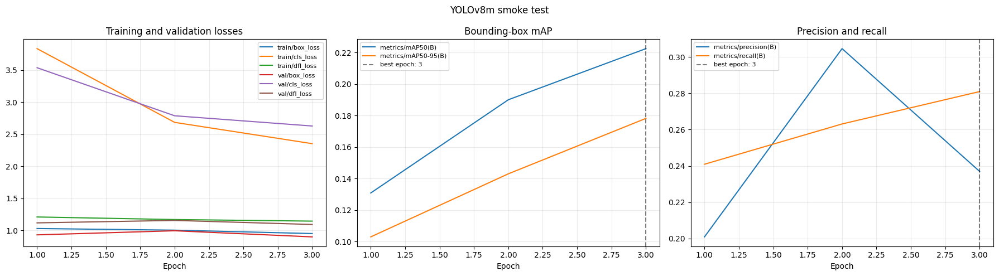

confusion_matrix_normalized.png


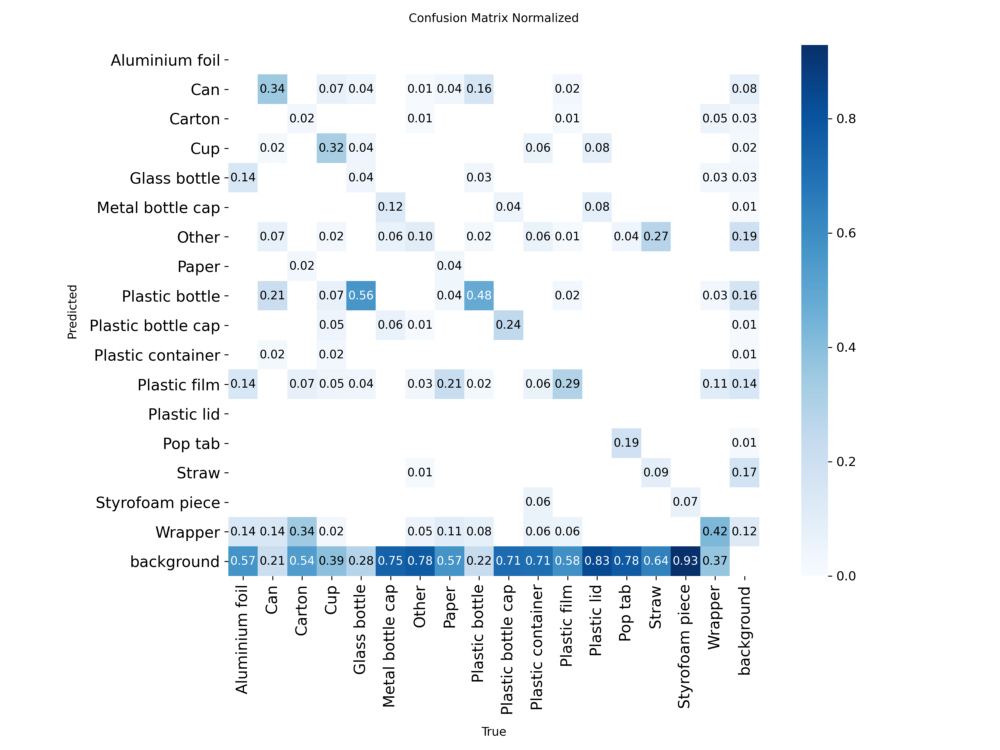

val_batch0_pred.jpg


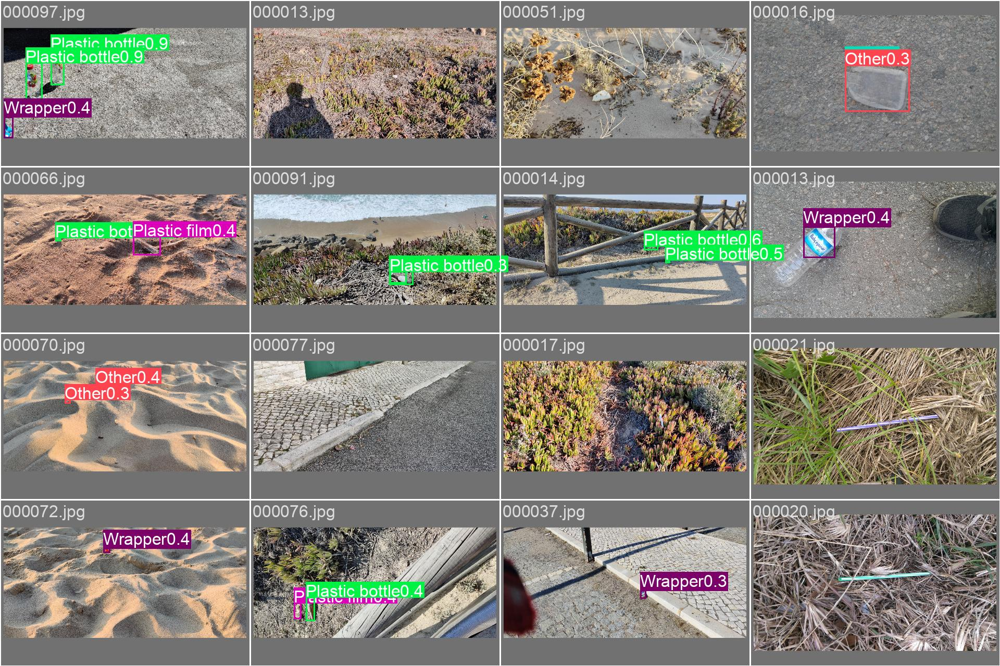

In [37]:
smoke_run_dir = Path("/content/yolo_runs/yolov8m_smoke")
smoke_history = plot_yolo_training_history(
    smoke_run_dir,
    "YOLOv8m smoke test",
)
show_yolo_artifacts(smoke_run_dir)

#### Smoke-test observations

The validation metrics rose rapidly across all three epochs: `mAP@0.5` increased from `0.131` to `0.222`, while `mAP@0.5:0.95` increased from `0.103` to `0.178`. The decreasing box, classification, and distribution-focal losses confirm that optimization is functioning. Because the best result occurs at the end of this short run, the model has not converged and is suitable as an initialization for the pilot.

### Pilot Run: 15 Epochs

The pilot continues from the smoke-test model and introduces a longer schedule, AdamW, cosine learning-rate decay, multi-scale augmentation, and a larger input resolution. Its checkpoint is then compared with the smoke checkpoint under identical `1024`-pixel validation settings so that the comparison is not distorted by different preprocessing.

In [21]:
print(type(model))
print(model.overrides)
print(getattr(model, "ckpt_path", None))

<class 'ultralytics.models.yolo.model.YOLO'>
{'task': 'detect', 'data': '/content/taco_yolo/taco.yaml', 'imgsz': 1024, 'single_cls': False}
yolov8m.pt


In [22]:
model.overrides["model"] = (
    getattr(model, "ckpt_path", None) or "yolov8m.pt"
)

In [23]:
model.train(
    data=str(yaml_path),
    epochs=15,
    imgsz=1280,
    batch=0.70,
    patience=5,
    optimizer="AdamW",
    lr0=1e-3,
    cos_lr=True,
    multi_scale=0.20,
    close_mosaic=5,
    amp=True,
    workers=4,
    device=0,
    project="/content/yolo_runs",
    name="yolov8m_map17_pilot",
    plots=True
)

Ultralytics 8.4.88 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=0.7, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=5, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/taco_yolo/taco.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.2, name=yolov8m_map17_pilot, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, ov

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79b7c8994ec0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.04

In [25]:
best_model = YOLO(
    "/content/yolo_runs/"
    "yolov8m_map17_pilot/weights/best.pt"
)

metrics = best_model.val(
    data=str(yaml_path),
    imgsz=1280,
    split="val",
    plots=True,
)

print("Precision:", metrics.box.mp)
print("Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)

Ultralytics 8.4.88 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
Model summary (fused): 93 layers, 25,849,603 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4258.4±187.6 MB/s, size: 1897.5 KB)
val: Scanning /content/taco_yolo/labels/val/batch_1.cache... 300 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 300/300 104.9Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 2.8it/s 6.9s0.2s
                   all        300        835      0.253      0.316      0.212      0.171
        Aluminium foil          7          7     0.0923      0.286     0.0444     0.0375
                   Can         39         58      0.333      0.645      0.425      0.353
                Carton         27         41      0.197      0.341      0.156      0.124
                   Cup         38         44      0.294      0.341      0.251      0.219
          Glass bot

In [27]:
checkpoints = {
    "smoke": "/content/yolo_runs/yolov8m_smoke/weights/best.pt",
    "pilot": "/content/yolo_runs/yolov8m_map17_pilot/weights/best.pt",
}

for name, path in checkpoints.items():
    metrics = YOLO(path).val(
        data=str(yaml_path),
        imgsz=1024,
        batch=16,
        device=0,
        plots=False,
    )

    print(
        name,
        "mAP50:", metrics.box.map50,
        "mAP50-95:", metrics.box.map,
    )

Ultralytics 8.4.88 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
Model summary (fused): 93 layers, 25,849,603 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4342.7±1259.0 MB/s, size: 1418.7 KB)
val: Scanning /content/taco_yolo/labels/val/batch_1.cache... 300 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 300/300 104.9Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 4.3it/s 4.5s0.1s
                   all        300        835       0.24      0.283      0.222      0.179
        Aluminium foil          7          7          0          0      0.035     0.0316
                   Can         39         58        0.4      0.603       0.49      0.409
                Carton         27         41      0.392      0.378      0.267      0.199
                   Cup         38         44      0.469      0.423       0.44      0.387
          Glass bo

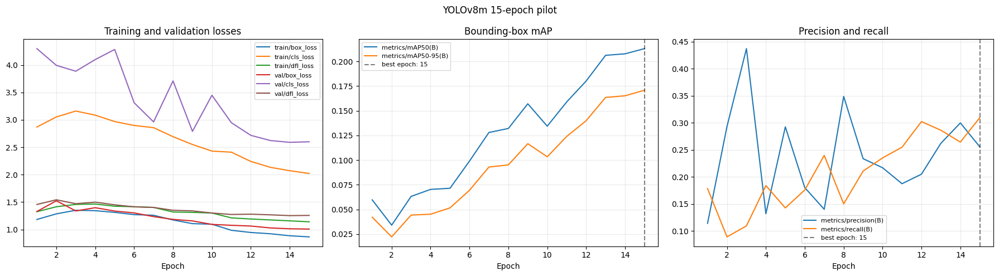

confusion_matrix_normalized.png


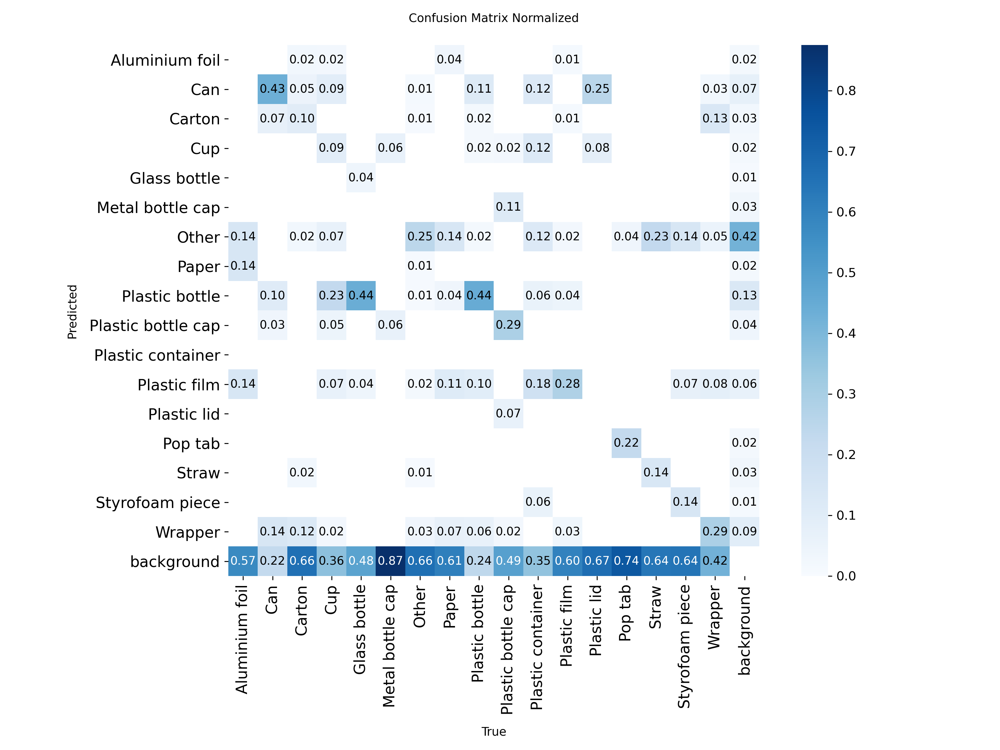

val_batch0_pred.jpg


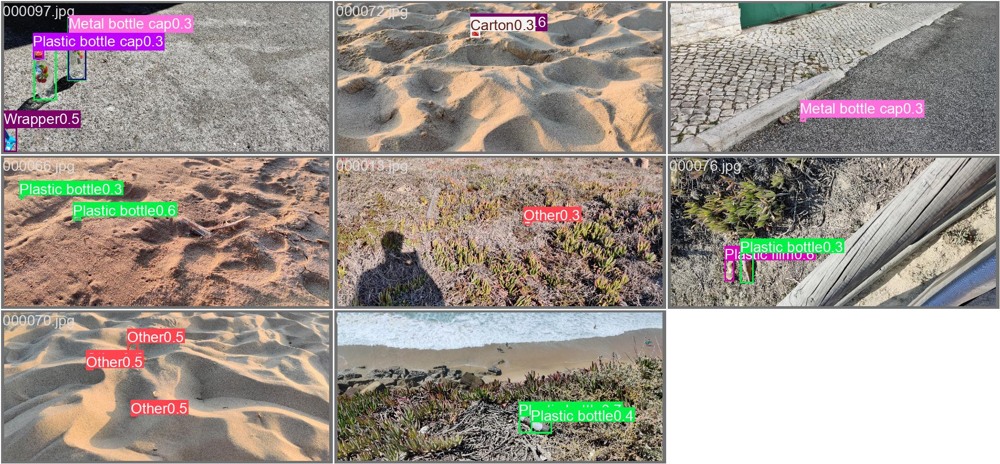

In [38]:
pilot_run_dir = Path("/content/yolo_runs/yolov8m_map17_pilot")
pilot_history = plot_yolo_training_history(
    pilot_run_dir,
    "YOLOv8m 15-epoch pilot",
)
show_yolo_artifacts(pilot_run_dir)

#### Pilot observations

When both checkpoints are evaluated at `imgsz=1024` with the same batch size, the pilot reaches `mAP@0.5 = 0.2296` and `mAP@0.5:0.95 = 0.1823`, compared with `0.2221` and `0.1787` for the smoke checkpoint. The gain is real but small and is not uniform across classes. The separate `1280`-pixel validation result must not be compared directly with the `1024`-pixel smoke result because image preprocessing changes the predictions.

The pilot therefore supplies a slightly stronger checkpoint, but its limited improvement motivates a lower learning rate and early stopping in the final continuation rather than simply repeating the same schedule.

### Final Run

The final stage starts from the pilot's best checkpoint, returns to `1024`-pixel inputs, lowers the learning rate, and enables early stopping. Although the configured upper bound is 60 additional epochs, training stops automatically when the validation fitness does not improve for ten epochs. The best checkpoint is retained independently from the final epoch.

In [29]:
model = YOLO(
      "/content/yolo_runs/yolov8m_map17_pilot/weights/best.pt"
  )

results = model.train(
    data=str(yaml_path),
    epochs=60,                 # upper bound for this continuation stage
    imgsz=1024,
    batch=0.70,
    patience=10,
    optimizer="AdamW",
    lr0=2e-4,                  # lower LR for continued training
    lrf=0.05,
    cos_lr=True,
    close_mosaic=10,
    amp=True,
    workers=4,
    device=0,
    seed=42,
    project="/content/drive/MyDrive/taco_yolo_runs",
    name="yolov8m_continued_42",
    save_period=5,
    plots=True,
)

Ultralytics 8.4.88 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=0.7, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/taco_yolo/taco.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0002, lrf=0.05, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/yolo_runs/yolov8m_map17_pilot/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8m_continued_42, nbs=64, nms=False, 

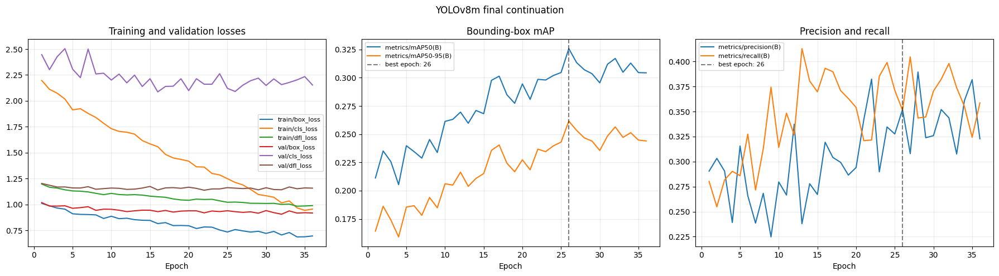

confusion_matrix_normalized.png


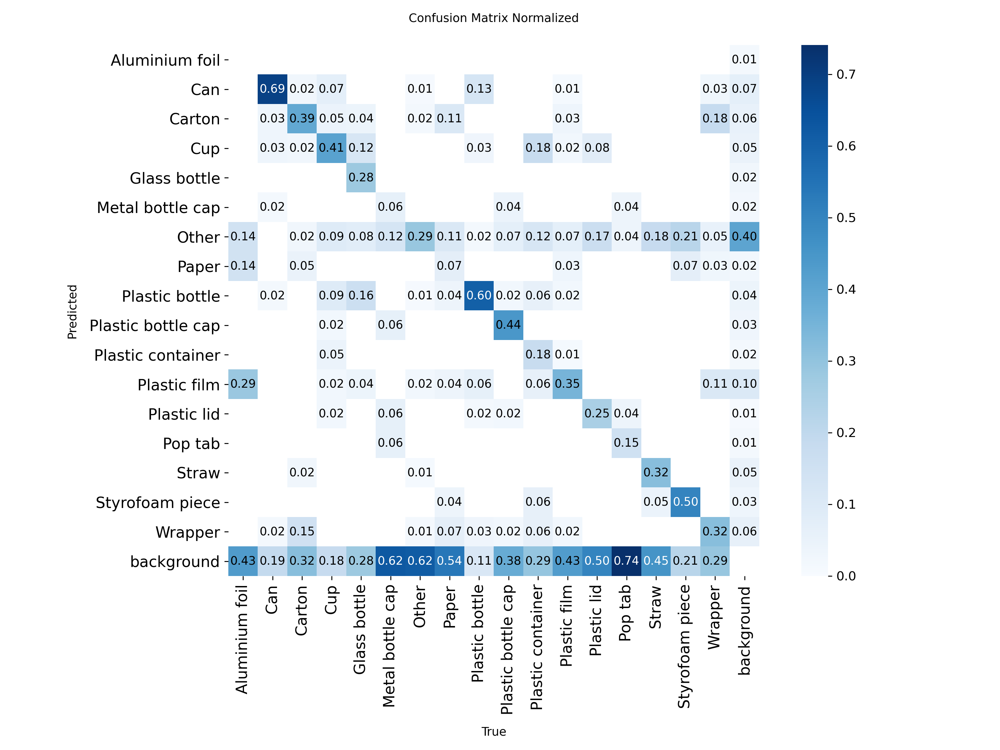

val_batch0_pred.jpg


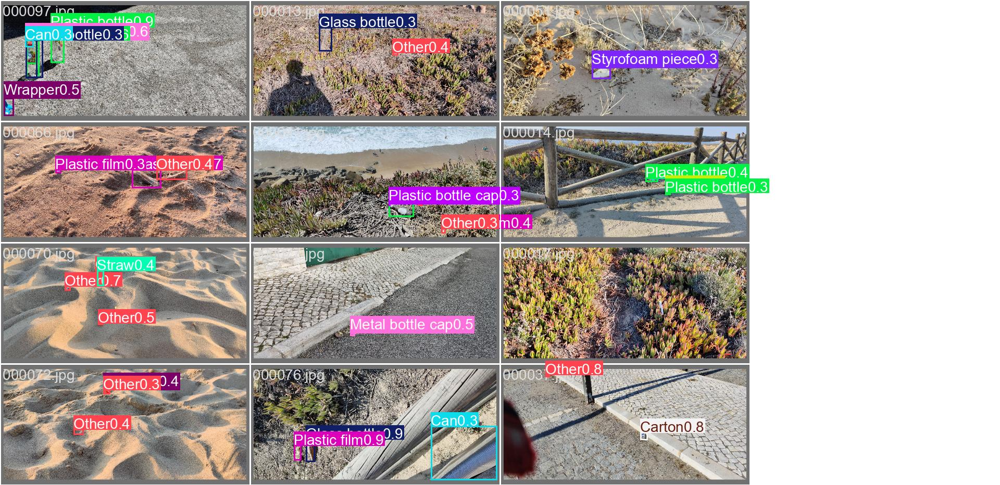

In [39]:
final_run_dir = Path(
    "/content/drive/MyDrive/taco_yolo_runs/yolov8m_continued_42"
)
final_history = plot_yolo_training_history(
    final_run_dir,
    "YOLOv8m final continuation",
)
show_yolo_artifacts(final_run_dir)

#### Initial validation check

The next cell records an initial validation attempt at `imgsz=1280`. It is retained to document why apparently inconsistent metrics were observed, but it is not the authoritative final evaluation: the training validator used `imgsz=1024` and a validation batch size of 12.

In [31]:
best_model = YOLO(
      "/content/drive/MyDrive/taco_yolo_runs/"
      "yolov8m_continued_42/weights/best.pt"
  )

metrics = best_model.val(
    data=str(yaml_path),
    imgsz=1280,
    split="val",
    plots=True,
)

print("Precision:", metrics.box.mp)
print("Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)

Ultralytics 8.4.88 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
Model summary (fused): 93 layers, 25,849,603 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3968.6±984.6 MB/s, size: 1600.5 KB)
val: Scanning /content/taco_yolo/labels/val/batch_1.cache... 300 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 300/300 114.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 2.8it/s 6.8s0.2s
                   all        300        835       0.27      0.401      0.275      0.215
        Aluminium foil          7          7      0.158      0.286     0.0702     0.0543
                   Can         39         58      0.496      0.741      0.623      0.527
                Carton         27         41      0.216       0.39      0.191      0.133
                   Cup         38         44      0.367      0.568      0.407      0.354
          Glass bot

#### Reproducible final validation

Reload the exact `best.pt` checkpoint and reproduce the conditions used during training validation. AutoBatch selected a training batch size of 6, and Ultralytics evaluated with batch size 12. Matching that value is necessary here because different rectangular batches can produce different padding shapes and noticeably different metrics.

In [32]:
from pathlib import Path
from ultralytics import YOLO

run_dir = Path(
    "/content/drive/MyDrive/taco_yolo_runs/yolov8m_continued_42"
)
best_path = run_dir / "weights" / "best.pt"

assert best_path.exists(), best_path

best_model = YOLO(str(best_path))
print("Checkpoint:", best_model.ckpt_path)

metrics = best_model.val(
    data=str(yaml_path),
    split="val",
    imgsz=1024,
    batch=12,       # match validation during training
    conf=0.001,
    iou=0.7,
    max_det=300,
    device=0,
    plots=True,
)

print("Precision:", metrics.box.mp)
print("Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)

Checkpoint: /content/drive/MyDrive/taco_yolo_runs/yolov8m_continued_42/weights/best.pt
Ultralytics 8.4.88 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
Model summary (fused): 93 layers, 25,849,603 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3490.9±724.0 MB/s, size: 1014.5 KB)
val: Scanning /content/taco_yolo/labels/val/batch_1.cache... 300 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 300/300 125.8Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 4.9it/s 5.1s0.2s
                   all        300        835      0.353      0.351      0.327      0.263
        Aluminium foil          7          7          0          0     0.0603     0.0515
                   Can         39         58      0.504      0.707      0.669       0.54
                Carton         27         41      0.262      0.381      0.273      0.176
                   Cu

In [33]:
import pandas as pd

history = pd.read_csv(run_dir / "results.csv")
history.columns = history.columns.str.strip()

best_row = history.loc[history["metrics/mAP50-95(B)"].idxmax()]

print(best_row[
    [
        "epoch",
        "metrics/precision(B)",
        "metrics/recall(B)",
        "metrics/mAP50(B)",
        "metrics/mAP50-95(B)",
    ]
])

epoch                   26.00000
metrics/precision(B)     0.35192
metrics/recall(B)        0.35130
metrics/mAP50(B)         0.32578
metrics/mAP50-95(B)      0.26161
Name: 25, dtype: float64


#### Final-run observations

The final run peaks at epoch 26 with precision `0.3519`, recall `0.3513`, `mAP@0.5 = 0.3258`, and `mAP@0.5:0.95 = 0.2616`. The independently reloaded checkpoint reproduces these values (`0.3266` and `0.2630`) when evaluated with the same batch size. Training then plateaus and stops after ten non-improving epochs, so `best.pt`, rather than `last.pt`, is the deployment checkpoint.

The learning curves show a substantial improvement over the pilot followed by a stable plateau. Qualitative prediction images and the normalized confusion matrix should be inspected alongside aggregate mAP because the final score averages classes with very different sample counts and difficulty.

## Overall Observations

- The smoke test reached `mAP@0.5 = 0.2221` and `mAP@0.5:0.95 = 0.1787` after only three epochs, confirming that the YOLO conversion and training pipeline were valid.
- Under identical validation settings, the pilot improved modestly to `mAP@0.5 = 0.2296` and `mAP@0.5:0.95 = 0.1823`. This justified a lower-learning-rate continuation, but the small gain also showed that validation settings must be held constant when comparing checkpoints.
- The final continuation produced the strongest checkpoint at epoch 26: precision `0.3520`, recall `0.3513`, `mAP@0.5 = 0.3258`, and `mAP@0.5:0.95 = 0.2616`. Reloading it with the same validation batch size reproduced `0.3266` and `0.2630` respectively.
- Early stopping terminated training after ten epochs without improvement. The best checkpoint should therefore be used for inference; continuing the unchanged schedule would mostly add compute and increase overfitting risk.
- Performance remains uneven across classes. `Can`, `Plastic bottle`, `Styrofoam piece`, and `Cup` are comparatively strong, while rare classes and the broad `Other` category remain the main sources of error.
- These values describe the validation split used for model selection. A separate test split is still required for an unbiased final estimate of generalization performance.